# Laboratorium 4 - Gotowe sieci w proszku

In [1]:
import os
from typing import Literal, LiteralString

import IPython.display as d

from ultralytics import YOLO
from ultralytics.engine.results import Results

import numpy as np
import pandas as pd

from PIL import Image, ImageFilter


def display(
    *images: np.ndarray,
    resize_scale: tuple[float, float] | None = None
) -> None:
    if (len(images) == 0):
        return

    pil_images: list[Image.Image] = [Image.fromarray(image) for image in images]

    if resize_scale is not None:
        sw, sh = resize_scale
        for i, image in enumerate(pil_images):
            w, h = image.size
            size: tuple[int, int] = int(sw * w), int(sh * h)
            pil_images[i] = image.resize(size, Image.Resampling.NEAREST)

    d.display(*pil_images)


OID_PATH = "./dataset/open-images-v7/"

## Weryfikacja dokładności modelu — wykrycie psa oraz kota na jednym obrazie

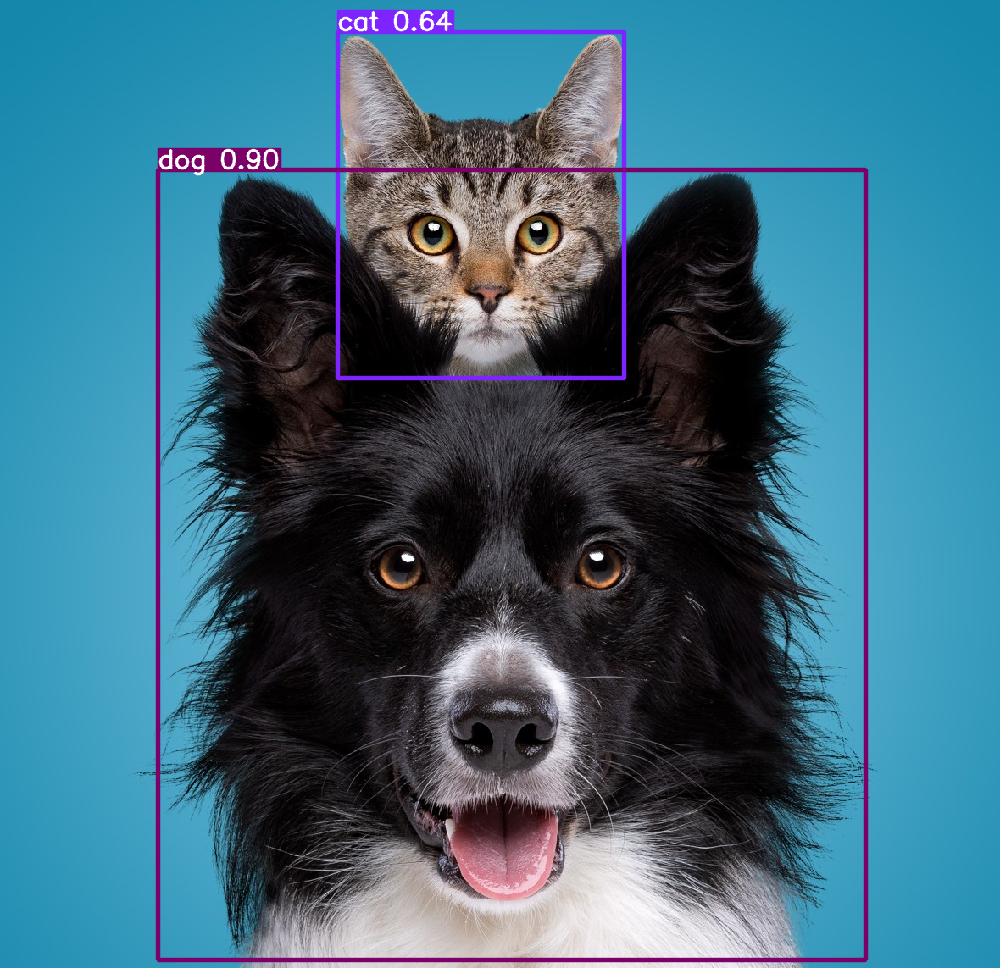

In [2]:
model: YOLO = YOLO("yolo11l.pt")
results = model("./dataset/dogat/dog-and-cat.jpg", verbose=False)[0]
display(results.plot()[:, :, ::-1])

## Przygotowanie zbioru danych

### Pobranie wymaganych danych

In [3]:
!wget \
    https://raw.githubusercontent.com/openimages/dataset/master/downloader.py \
    -O ./downloader.py
!wget \
    https://storage.googleapis.com/openimages/v7/oidv7-class-descriptions-boxable.csv \
    -O ./dataset/open-images-v7/class-descriptions.csv
!wget \
    https://storage.googleapis.com/openimages/v6/oidv6-train-annotations-bbox.csv \
    -O ./dataset/open-images-v7/train-bbox-annotations.csv
!wget \
    https://storage.googleapis.com/openimages/v5/validation-annotations-bbox.csv \
    -O ./dataset/open-images-v7/validation-bbox-annotations.csv

--2024-11-17 23:36:50--  https://raw.githubusercontent.com/openimages/dataset/master/downloader.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.111.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4244 (4.1K) [text/plain]
Saving to: ‘./downloader.py’

./downloader.py     100%[===================>]   4.14K  --.-KB/s    in 0.001s  

2024-11-17 23:36:50 (4.83 MB/s) - ‘./downloader.py’ saved [4244/4244]

--2024-11-17 23:36:51--  https://storage.googleapis.com/openimages/v7/oidv7-class-descriptions-boxable.csv
Resolving storage.googleapis.com (storage.googleapis.com)... 142.250.203.155, 172.217.16.59, 142.250.203.219, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.250.203.155|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 12064 (12K) [text/csv]
Saving to: ‘./data

### Wygenerowanie plików tekstowych do pobrania obrazów i zapisania etykiet do formatu kompatibilnego z YOLO

#### Pozyskanie etykiety definiującej jedzenie

In [4]:
label_descriptions: pd.DataFrame = pd.read_csv(
    os.path.join(OID_PATH, "class-descriptions.csv")
)

food_label: str = label_descriptions[
    label_descriptions["DisplayName"] == "Food"
]["LabelName"].values[0]
food_label

'/m/02wbm'

#### Wylosowanie podzbioru identyfikatorów obrazów treningowych

In [5]:
train_df: pd.DataFrame = pd.read_csv(
    os.path.join(OID_PATH, "train-bbox-annotations.csv")
)
train_df = train_df[train_df["LabelName"] == food_label]

train_image_ids: np.ndarray = train_df["ImageID"].unique()
train_image_ids = train_image_ids[
    np.random.choice(train_image_ids.shape[0], size=2500, replace=False)
]

pd.Series(train_image_ids)

0       3b3b5c90f5603bd0
1       eb0634a0b155f569
2       3785e4bbcfe01644
3       31172cfdfc1a0fdc
4       1a5035cd7a020fb2
              ...       
2495    1343f7cd35da81db
2496    4f6a9b110877cba5
2497    5c6f1a260846ec13
2498    606b3085f7302c5e
2499    32a04896fd069910
Length: 2500, dtype: object

#### Ograniczenie zbioru etykiet do wylosowanych obrazów treningowych

In [6]:
train_df = train_df[train_df["ImageID"].isin(train_image_ids)]
train_df

,ImageID,Source,LabelName,Confidence,XMin,XMax,YMin,YMax,IsOccluded,IsTruncated,...,IsDepiction,IsInside,XClick1X,XClick2X,XClick3X,XClick4X,XClick1Y,XClick2Y,XClick3Y,XClick4Y
3219,0001d1b33deff2d3,xclick,/m/02wbm,1,0.086601,0.998366,0.129085,0.838235,1,1,...,0,0,0.534314,0.086601,0.998366,0.797386,0.129085,0.751634,0.589869,0.838235
9682,0006e2ef92e0ed4a,xclick,/m/02wbm,1,0.359375,0.457500,0.404516,0.528692,1,0,...,0,0,0.386250,0.359375,0.430625,0.457500,0.404516,0.439323,0.528692,0.428034
9683,0006e2ef92e0ed4a,xclick,/m/02wbm,1,0.493750,0.576875,0.449671,0.532455,1,0,...,0,0,0.543750,0.493750,0.525625,0.576875,0.449671,0.508937,0.532455,0.484478
9684,0006e2ef92e0ed4a,xclick,/m/02wbm,1,0.500000,0.831875,0.553151,0.842897,1,0,...,0,0,0.581875,0.500000,0.798750,0.831875,0.553151,0.640640,0.842897,0.686736
9685,0006e2ef92e0ed4a,xclick,/m/02wbm,1,0.668750,0.791250,0.616181,0.747883,0,0,...,0,0,0.723125,0.668750,0.791250,0.718750,0.616181,0.713076,0.714958,0.747883
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14597909,ffc225384bb1ced5,xclick,/m/02wbm,1,0.643125,0.711250,0.675314,0.697908,1,0,...,0,0,0.681875,0.643125,0.708750,0.711250,0.675314,0.687029,0.697908,0.688703
14597910,ffc225384bb1ced5,xclick,/m/02wbm,1,0.676875,0.700000,0.631799,0.652720,1,0,...,1,0,0.688125,0.676875,0.692500,0.700000,0.631799,0.642678,0.652720,0.649372
14597911,ffc225384bb1ced5,xclick,/m/02wbm,1,0.922500,0.967500,0.444351,0.535565,0,0,...,0,0,0.948125,0.967500,0.962500,0.922500,0.444351,0.525523,0.535565,0.525523
14597912,ffc225384bb1ced5,xclick,/m/02wbm,1,0.927500,0.943125,0.675314,0.717992,1,0,...,0,0,0.930000,0.927500,0.939375,0.943125,0.675314,0.714644,0.717992,0.685356


#### Wylosowanie podzbioru identyfikatorów obrazów walidacyjnych

In [7]:
val_df: pd.DataFrame = pd.read_csv(
    os.path.join(OID_PATH, "validation-bbox-annotations.csv")
)
val_df = val_df[val_df["LabelName"] == food_label]

val_image_ids: np.ndarray = val_df["ImageID"].unique()
val_image_ids = val_image_ids[
    np.random.choice(val_image_ids.shape[0], size=500, replace=False)
]

pd.Series(val_image_ids)


0      703009d40ce664a3
1      08053556dc12be2d
2      cda86ab0b6a6b053
3      510fa4d5eec21a6f
4      00e0a53e14bf2447
             ...       
495    62aa9dfcadec44ea
496    e82b710e23910c29
497    88db0f763f545ba2
498    0251452642908e43
499    f36cfc074e42e59a
Length: 500, dtype: object

#### Ograniczenie zbioru etykiet do wylosowanych obrazów walidacyjnych

In [8]:
val_df = val_df[val_df["ImageID"].isin(val_image_ids)]
val_df

,ImageID,Source,LabelName,Confidence,XMin,XMax,YMin,YMax,IsOccluded,IsTruncated,IsGroupOf,IsDepiction,IsInside
1,000595fe6fee6369,xclick,/m/02wbm,1,0.000000,1.000000,0.000000,1.000000,0,0,1,0,0
1030,00e0a53e14bf2447,xclick,/m/02wbm,1,0.000000,1.000000,0.143750,0.964583,0,0,0,0,0
1890,0180e1bbb7a3bfa4,xclick,/m/02wbm,1,0.000000,1.000000,0.106250,1.000000,0,1,0,0,0
2448,01dc49e587b180a4,xclick,/m/02wbm,1,0.335938,0.465625,0.754167,0.839583,1,0,0,0,0
2449,01dc49e587b180a4,xclick,/m/02wbm,1,0.340625,0.446875,0.664583,0.710417,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
300337,fd0d412d887369ad,xclick,/m/02wbm,1,0.000000,1.000000,0.000000,1.000000,0,0,0,0,0
301107,fd6549d70c9acda6,xclick,/m/02wbm,1,0.103286,0.902973,0.168750,0.822917,0,0,0,0,0
301243,fda93c17da7c581c,xclick,/m/02wbm,1,0.476562,1.000000,0.000000,0.616667,0,1,0,0,0
301422,fdbf3388363282e2,xclick,/m/02wbm,1,0.000000,1.000000,0.176563,0.820312,0,1,0,0,0


#### Wygenerowanie pliku tekstowego służącego do pobrania zbioru obrazów z kategorii jedzenie

In [9]:
def generate_downloadable_image_file(
    image_ids: np.ndarray,
    mode: Literal["train", "validation"]
) -> None:
    with open(
        os.path.join(OID_PATH, f"{mode}-downloadable-images.txt"), "w"
    ) as f:
        for image_id in image_ids:
            f.write(f"{mode}/{image_id}\n")

In [10]:
generate_downloadable_image_file(train_image_ids, "train")
generate_downloadable_image_file(val_image_ids, "validation")

#### Wygenerowanie zbioru etykiet

In [11]:
def oid_bbox_to_yolo(row: pd.Series) -> tuple[float, float, float, float]:
    x_min: float = row["XMin"]
    x_max: float = row["XMax"]
    y_min: float = row["YMin"]
    y_max: float = row["YMax"]

    width: float = x_max - x_min
    height: float = y_max - y_min

    center_x: float = (x_min + x_max) / 2
    center_y: float = (y_min + y_max) / 2

    return center_x, center_y, width, height


def generate_label_files(
    df: pd.DataFrame,
    mode: Literal["train", "validation"]
) -> None:
    base_path: LiteralString = os.path.join(
        OID_PATH, "labels", mode
    )
    os.makedirs(base_path, exist_ok=True)

    bbox_annotations: dict[str, list[tuple[float, float, float, float]]] = {}

    for _, row in df.iterrows():
        image_id = row["ImageID"]

        if image_id not in bbox_annotations:
            bbox_annotations[image_id] = []
        bbox_annotations[image_id].append(oid_bbox_to_yolo(row))

    for image_id, annotations in bbox_annotations.items():
        filepath: LiteralString = os.path.join(base_path, f"{image_id}.txt")
        with open(filepath, "w") as f:
            for annotation in annotations:
                f.write(f"0 {' '.join(map(str, annotation))}\n")

In [12]:
generate_label_files(train_df, "train")
generate_label_files(val_df, "validation")

### Pobranie obrazów treningowych i walidacyjnych

In [13]:
!python downloader.py \
    --download_folder ./dataset/open-images-v7/images/train \
    ./dataset/open-images-v7/train-downloadable-images.txt
!python downloader.py \
    --download_folder ./dataset/open-images-v7/images/validation \
    ./dataset/open-images-v7/validation-downloadable-images.txt

In [14]:
def generate_yolo_dataset_config() -> None:
    abspath: str = os.path.abspath(OID_PATH)
    filepath: str = os.path.join(abspath, "oidv7.yaml")

    with open(filepath, "w") as file:
        file.write(
            f"path: {abspath}\n"
            "train: images/train\n"
            "val: images/validation\n"
            "\n"
            "names:\n"
            "    0: Food\n"
        )

In [15]:
generate_yolo_dataset_config()

## Trening modelu

In [16]:
model: YOLO = YOLO("yolo11n.pt")

results = model.train(
    data=os.path.join(OID_PATH, "oidv7.yaml"),
    epochs=10,
    device="mps"
)

Ultralytics 8.3.32 🚀 Python-3.12.7 torch-2.5.1 MPS (Apple M1 Pro)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=./dataset/open-images-v7/oidv7.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=mps, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, l

train: Scanning /Volumes/ComputerScience/uni/sem7/image-recognition/lab4-detection-yolo/dataset/open-images-v7/labels/train... 2500 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2500/2500 [00:00<00:00, 2645.59it/s]

train: New cache created: /Volumes/ComputerScience/uni/sem7/image-recognition/lab4-detection-yolo/dataset/open-images-v7/labels/train.cache



val: Scanning /Volumes/ComputerScience/uni/sem7/image-recognition/lab4-detection-yolo/dataset/open-images-v7/labels/validation... 500 images, 0 backgrounds, 0 corrupt: 100%|██████████| 500/500 [00:00<00:00, 2693.95it/s]

val: New cache created: /Volumes/ComputerScience/uni/sem7/image-recognition/lab4-detection-yolo/dataset/open-images-v7/labels/validation.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/detect/train
Starting training for 10 epochs...
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      5.93G      1.526       2.49      1.577         29        640: 100%|██████████| 157/157 [04:29<00:00,  1.71s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/16 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   6%|▋         | 1/16 [00:14<03:31, 14.08s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  12%|█▎        | 2/16 [00:22<02:29, 10.67s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  19%|█▉        | 3/16 [00:31<02:07,  9.78s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  25%|██▌       | 4/16 [00:38<01:47,  8.95s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  31%|███▏      | 5/16 [00:50<01:50, 10.05s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  38%|███▊      | 6/16 [00:59<01:34,  9.48s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  44%|████▍     | 7/16 [01:07<01:21,  9.10s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 8/16 [01:15<01:10,  8.84s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  56%|█████▋    | 9/16 [01:24<01:01,  8.85s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  62%|██████▎   | 10/16 [01:33<00:52,  8.75s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  69%|██████▉   | 11/16 [01:40<00:41,  8.40s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  75%|███████▌  | 12/16 [01:53<00:38,  9.73s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  81%|████████▏ | 13/16 [02:03<00:29,  9.76s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  88%|████████▊ | 14/16 [02:11<00:18,  9.31s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  94%|█████████▍| 15/16 [02:20<00:09,  9.26s/it]

WARNING ⚠️ NMS time limit 3.000s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [02:31<00:00,  9.48s/it]


                   all        500        799      0.248       0.17     0.0912     0.0494

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      6.48G      1.706      2.226      1.735          7        640: 100%|██████████| 157/157 [07:12<00:00,  2.76s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/16 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   6%|▋         | 1/16 [00:05<01:19,  5.28s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  12%|█▎        | 2/16 [00:11<01:21,  5.84s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  19%|█▉        | 3/16 [00:17<01:19,  6.12s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  25%|██▌       | 4/16 [00:24<01:14,  6.24s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  31%|███▏      | 5/16 [00:32<01:15,  6.85s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  38%|███▊      | 6/16 [00:38<01:06,  6.66s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  44%|████▍     | 7/16 [00:45<00:59,  6.62s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 8/16 [00:51<00:51,  6.40s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  56%|█████▋    | 9/16 [00:57<00:44,  6.36s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  62%|██████▎   | 10/16 [01:05<00:41,  6.92s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  69%|██████▉   | 11/16 [01:13<00:36,  7.29s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  75%|███████▌  | 12/16 [01:20<00:28,  7.07s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  81%|████████▏ | 13/16 [01:27<00:20,  6.99s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  88%|████████▊ | 14/16 [01:33<00:13,  6.84s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  94%|█████████▍| 15/16 [01:41<00:07,  7.30s/it]

WARNING ⚠️ NMS time limit 3.000s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [01:46<00:00,  6.67s/it]


                   all        500        799      0.281     0.0676     0.0514     0.0249

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      6.76G      1.743      2.082      1.757         12        640: 100%|██████████| 157/157 [07:00<00:00,  2.68s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/16 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   6%|▋         | 1/16 [00:10<02:43, 10.89s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  12%|█▎        | 2/16 [00:21<02:26, 10.46s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  19%|█▉        | 3/16 [00:29<02:02,  9.44s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  25%|██▌       | 4/16 [00:42<02:09, 10.78s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  31%|███▏      | 5/16 [00:51<01:51, 10.11s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  38%|███▊      | 6/16 [01:01<01:41, 10.19s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  44%|████▍     | 7/16 [01:11<01:31, 10.21s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 8/16 [01:22<01:24, 10.52s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  56%|█████▋    | 9/16 [01:32<01:10, 10.11s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  62%|██████▎   | 10/16 [01:40<00:57,  9.58s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  69%|██████▉   | 11/16 [01:49<00:47,  9.47s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  75%|███████▌  | 12/16 [01:59<00:37,  9.45s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  81%|████████▏ | 13/16 [02:10<00:30, 10.20s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  88%|████████▊ | 14/16 [02:22<00:21, 10.52s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  94%|█████████▍| 15/16 [02:31<00:10, 10.30s/it]

WARNING ⚠️ NMS time limit 3.000s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [02:37<00:00,  9.86s/it]


                   all        500        799      0.266     0.0864     0.0648     0.0346

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      7.03G      1.701      1.957      1.739          6        640: 100%|██████████| 157/157 [07:53<00:00,  3.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/16 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   6%|▋         | 1/16 [00:10<02:36, 10.47s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  12%|█▎        | 2/16 [00:21<02:27, 10.54s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  19%|█▉        | 3/16 [00:28<01:57,  9.08s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  25%|██▌       | 4/16 [00:35<01:39,  8.31s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  31%|███▏      | 5/16 [00:44<01:32,  8.39s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  38%|███▊      | 6/16 [00:51<01:21,  8.15s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  44%|████▍     | 7/16 [01:01<01:18,  8.75s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 8/16 [01:07<01:03,  7.92s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  56%|█████▋    | 9/16 [01:19<01:03,  9.12s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  62%|██████▎   | 10/16 [01:26<00:50,  8.43s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  69%|██████▉   | 11/16 [01:33<00:40,  8.04s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  75%|███████▌  | 12/16 [01:40<00:30,  7.74s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  81%|████████▏ | 13/16 [01:48<00:22,  7.61s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  88%|████████▊ | 14/16 [01:56<00:15,  7.89s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  94%|█████████▍| 15/16 [02:05<00:08,  8.10s/it]

WARNING ⚠️ NMS time limit 3.000s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [02:11<00:00,  8.19s/it]


                   all        500        799      0.364     0.0613     0.0544      0.031

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      7.35G       1.65      1.838      1.681         17        640: 100%|██████████| 157/157 [09:28<00:00,  3.62s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/16 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   6%|▋         | 1/16 [00:09<02:20,  9.39s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  12%|█▎        | 2/16 [00:16<01:56,  8.32s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  19%|█▉        | 3/16 [00:24<01:40,  7.77s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  25%|██▌       | 4/16 [00:32<01:38,  8.18s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  31%|███▏      | 5/16 [00:41<01:33,  8.52s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  38%|███▊      | 6/16 [00:51<01:29,  8.96s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  44%|████▍     | 7/16 [01:01<01:21,  9.08s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 8/16 [01:08<01:07,  8.47s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  56%|█████▋    | 9/16 [01:18<01:03,  9.07s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  62%|██████▎   | 10/16 [01:26<00:51,  8.53s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  69%|██████▉   | 11/16 [01:35<00:43,  8.70s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  75%|███████▌  | 12/16 [01:43<00:34,  8.75s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  81%|████████▏ | 13/16 [01:51<00:25,  8.45s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  88%|████████▊ | 14/16 [02:02<00:18,  9.11s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  94%|█████████▍| 15/16 [02:11<00:09,  9.13s/it]

WARNING ⚠️ NMS time limit 3.000s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [02:17<00:00,  8.58s/it]


                   all        500        799       0.35     0.0776      0.066     0.0375

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10       7.7G      1.599      1.767      1.642         44        640: 100%|██████████| 157/157 [10:04<00:00,  3.85s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/16 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   6%|▋         | 1/16 [00:07<01:58,  7.91s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  12%|█▎        | 2/16 [00:17<02:05,  8.99s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  19%|█▉        | 3/16 [00:27<02:04,  9.58s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  25%|██▌       | 4/16 [00:36<01:52,  9.37s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  31%|███▏      | 5/16 [00:45<01:39,  9.06s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  38%|███▊      | 6/16 [00:57<01:39,  9.98s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  44%|████▍     | 7/16 [01:06<01:28,  9.85s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 8/16 [01:18<01:23, 10.39s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  56%|█████▋    | 9/16 [01:27<01:09,  9.86s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  62%|██████▎   | 10/16 [01:36<00:57,  9.62s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  69%|██████▉   | 11/16 [01:45<00:47,  9.53s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  75%|███████▌  | 12/16 [01:56<00:39,  9.85s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  81%|████████▏ | 13/16 [02:03<00:27,  9.20s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  88%|████████▊ | 14/16 [02:13<00:18,  9.33s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  94%|█████████▍| 15/16 [02:24<00:09,  9.81s/it]

WARNING ⚠️ NMS time limit 3.000s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [02:30<00:00,  9.43s/it]


                   all        500        799      0.348     0.0626     0.0601     0.0383

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      8.04G      1.538      1.685       1.61         26        640: 100%|██████████| 157/157 [10:56<00:00,  4.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/16 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   6%|▋         | 1/16 [00:17<04:20, 17.34s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  12%|█▎        | 2/16 [00:28<03:15, 13.99s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  19%|█▉        | 3/16 [00:42<02:58, 13.74s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  25%|██▌       | 4/16 [00:57<02:53, 14.44s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  31%|███▏      | 5/16 [01:11<02:33, 13.98s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  38%|███▊      | 6/16 [01:23<02:15, 13.52s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  44%|████▍     | 7/16 [01:34<01:52, 12.49s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 8/16 [01:46<01:38, 12.32s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  56%|█████▋    | 9/16 [01:54<01:17, 11.01s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  62%|██████▎   | 10/16 [02:06<01:07, 11.30s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  69%|██████▉   | 11/16 [02:18<00:58, 11.78s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  75%|███████▌  | 12/16 [02:29<00:45, 11.45s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  81%|████████▏ | 13/16 [02:42<00:35, 11.71s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  88%|████████▊ | 14/16 [02:54<00:24, 12.01s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  94%|█████████▍| 15/16 [03:03<00:11, 11.07s/it]

WARNING ⚠️ NMS time limit 3.000s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [03:12<00:00, 12.01s/it]


                   all        500        799      0.398     0.0854     0.0863     0.0577

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      8.35G      1.506      1.607      1.567          8        640: 100%|██████████| 157/157 [11:32<00:00,  4.41s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/16 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   6%|▋         | 1/16 [00:07<01:51,  7.42s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  12%|█▎        | 2/16 [00:17<02:06,  9.01s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  19%|█▉        | 3/16 [00:28<02:07,  9.84s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  25%|██▌       | 4/16 [00:37<01:54,  9.57s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  31%|███▏      | 5/16 [00:48<01:49,  9.92s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  38%|███▊      | 6/16 [00:57<01:37,  9.80s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  44%|████▍     | 7/16 [01:06<01:26,  9.62s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 8/16 [01:18<01:21, 10.18s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  56%|█████▋    | 9/16 [01:26<01:07,  9.58s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  62%|██████▎   | 10/16 [01:35<00:56,  9.38s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  69%|██████▉   | 11/16 [01:47<00:51, 10.33s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  75%|███████▌  | 12/16 [02:01<00:45, 11.30s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  81%|████████▏ | 13/16 [02:12<00:33, 11.19s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  88%|████████▊ | 14/16 [02:22<00:21, 10.86s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  94%|█████████▍| 15/16 [02:33<00:10, 10.88s/it]

WARNING ⚠️ NMS time limit 3.000s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [02:39<00:00,  9.99s/it]


                   all        500        799      0.407     0.0876     0.0804     0.0542

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      8.75G      1.474      1.548      1.549         28        640: 100%|██████████| 157/157 [13:56<00:00,  5.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/16 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   6%|▋         | 1/16 [00:12<03:00, 12.03s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  12%|█▎        | 2/16 [00:24<02:50, 12.16s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  19%|█▉        | 3/16 [00:31<02:09,  9.96s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  25%|██▌       | 4/16 [00:44<02:15, 11.29s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  31%|███▏      | 5/16 [00:53<01:54, 10.40s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  38%|███▊      | 6/16 [01:02<01:39,  9.97s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  44%|████▍     | 7/16 [01:12<01:28,  9.82s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 8/16 [01:22<01:19,  9.95s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  56%|█████▋    | 9/16 [01:31<01:07,  9.69s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  62%|██████▎   | 10/16 [01:38<00:53,  8.93s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  69%|██████▉   | 11/16 [01:47<00:44,  8.94s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  75%|███████▌  | 12/16 [01:59<00:38,  9.66s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  81%|████████▏ | 13/16 [02:10<00:30, 10.02s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  88%|████████▊ | 14/16 [02:22<00:21, 10.62s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  94%|█████████▍| 15/16 [02:31<00:10, 10.37s/it]

WARNING ⚠️ NMS time limit 3.000s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [02:39<00:00,  9.98s/it]


                   all        500        799      0.302     0.0738     0.0624     0.0435

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      9.13G      1.436      1.483        1.5         13        640: 100%|██████████| 157/157 [14:58<00:00,  5.72s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/16 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   6%|▋         | 1/16 [00:06<01:31,  6.10s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  12%|█▎        | 2/16 [00:14<01:47,  7.70s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  19%|█▉        | 3/16 [00:22<01:39,  7.64s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  25%|██▌       | 4/16 [00:31<01:39,  8.26s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  31%|███▏      | 5/16 [00:40<01:34,  8.63s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  38%|███▊      | 6/16 [00:50<01:28,  8.80s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  44%|████▍     | 7/16 [01:01<01:26,  9.58s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 8/16 [01:12<01:19,  9.97s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  56%|█████▋    | 9/16 [01:21<01:08,  9.86s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  62%|██████▎   | 10/16 [01:32<01:01, 10.27s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  69%|██████▉   | 11/16 [01:42<00:51, 10.21s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  75%|███████▌  | 12/16 [01:52<00:40, 10.00s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  81%|████████▏ | 13/16 [02:03<00:30, 10.19s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  88%|████████▊ | 14/16 [02:11<00:19,  9.75s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  94%|█████████▍| 15/16 [02:20<00:09,  9.53s/it]

WARNING ⚠️ NMS time limit 3.000s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [02:28<00:00,  9.25s/it]


                   all        500        799      0.255     0.0688     0.0491     0.0355

10 epochs completed in 2.047 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.32 🚀 Python-3.12.7 torch-2.5.1 MPS (Apple M1 Pro)
YOLO11n summary (fused): 238 layers, 2,582,347 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/16 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   6%|▋         | 1/16 [00:15<03:58, 15.90s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  12%|█▎        | 2/16 [00:29<03:25, 14.70s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  19%|█▉        | 3/16 [00:40<02:44, 12.67s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  25%|██▌       | 4/16 [00:48<02:11, 10.92s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  31%|███▏      | 5/16 [01:01<02:10, 11.84s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  38%|███▊      | 6/16 [01:20<02:22, 14.23s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  44%|████▍     | 7/16 [01:30<01:55, 12.88s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 8/16 [01:38<01:30, 11.32s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  56%|█████▋    | 9/16 [01:47<01:14, 10.64s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  62%|██████▎   | 10/16 [01:57<01:02, 10.34s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  69%|██████▉   | 11/16 [02:15<01:03, 12.71s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  75%|███████▌  | 12/16 [02:31<00:54, 13.73s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  81%|████████▏ | 13/16 [02:40<00:36, 12.28s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  88%|████████▊ | 14/16 [02:49<00:22, 11.14s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  94%|█████████▍| 15/16 [02:58<00:10, 10.73s/it]

WARNING ⚠️ NMS time limit 3.000s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [03:11<00:00, 11.96s/it]


                   all        500        799      0.552      0.143      0.153      0.105
Speed: 7.4ms preprocess, 45.3ms inference, 0.0ms loss, 133.7ms postprocess per image
Results saved to runs/detect/train


## Walidacja modelu

In [17]:
best_model: YOLO = YOLO("./runs/detect/train/weights/best.pt", task="detect")
image_names: list[str] = ["0.jpg", "1.jpg", "2.jpg", "3.jpg", "4.jpg"]

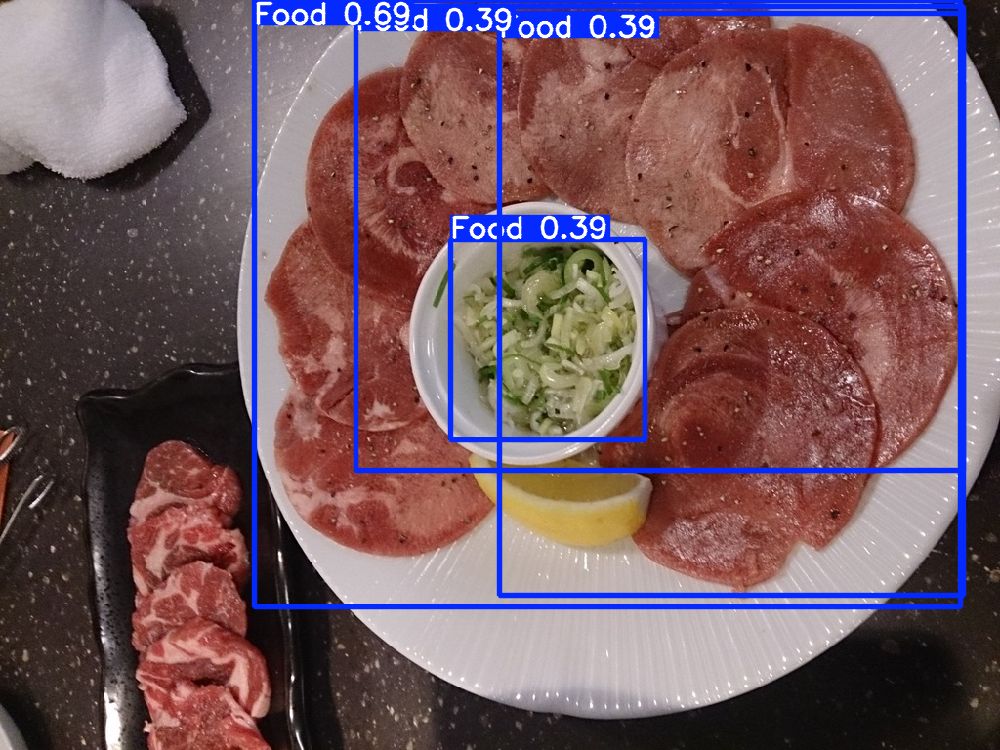

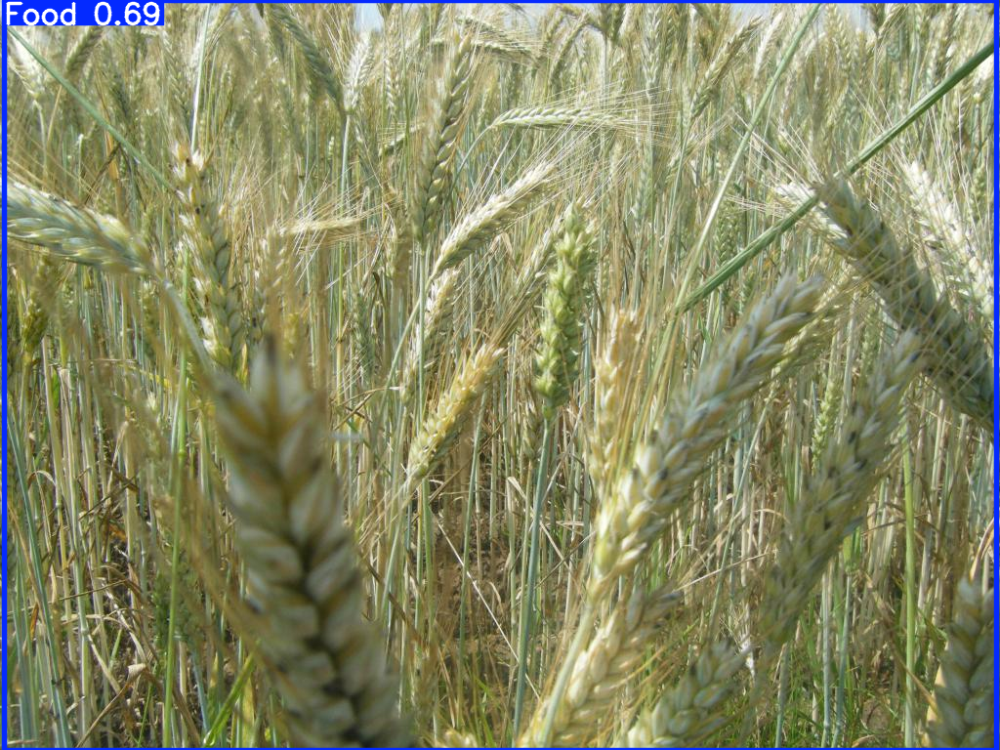

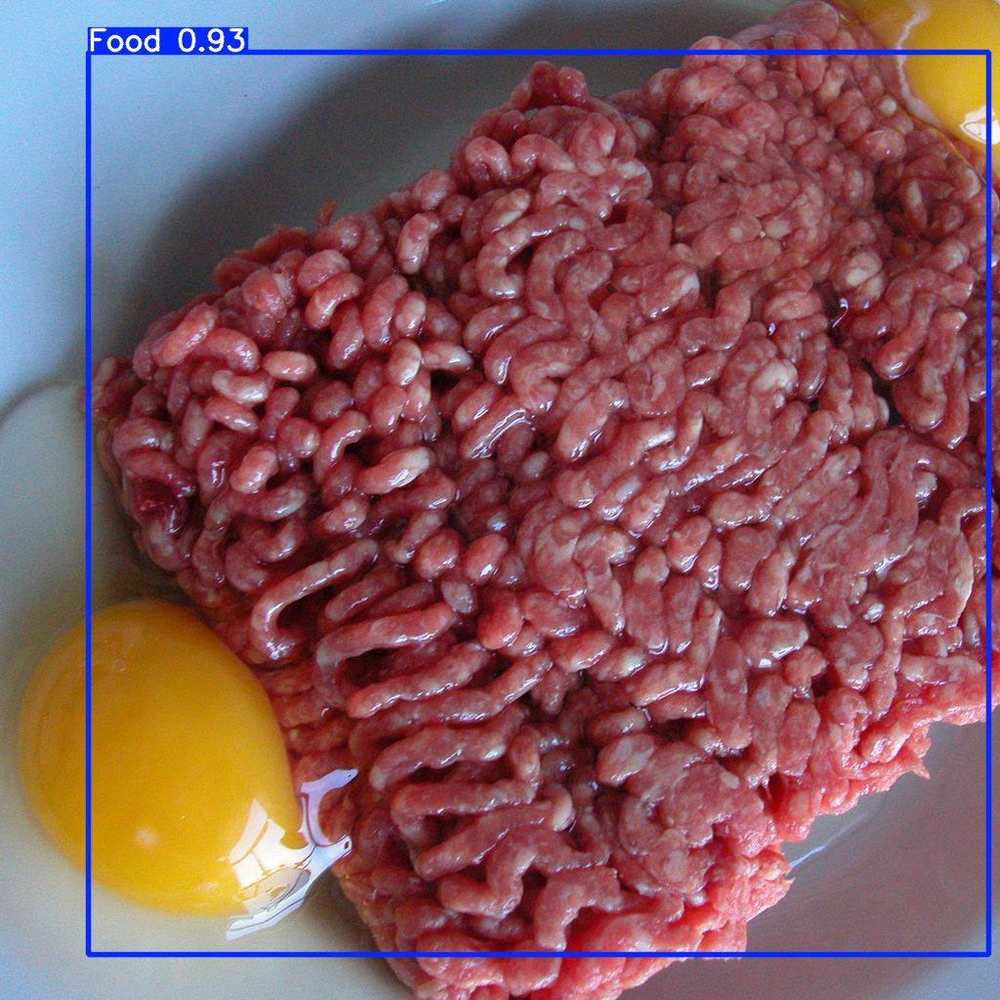

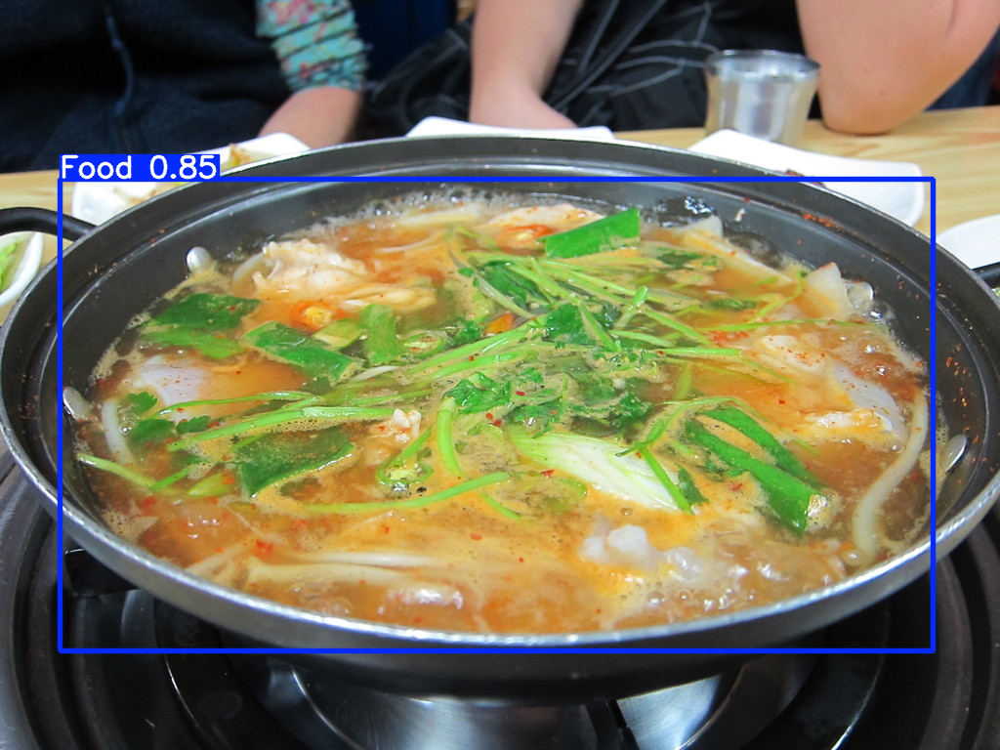

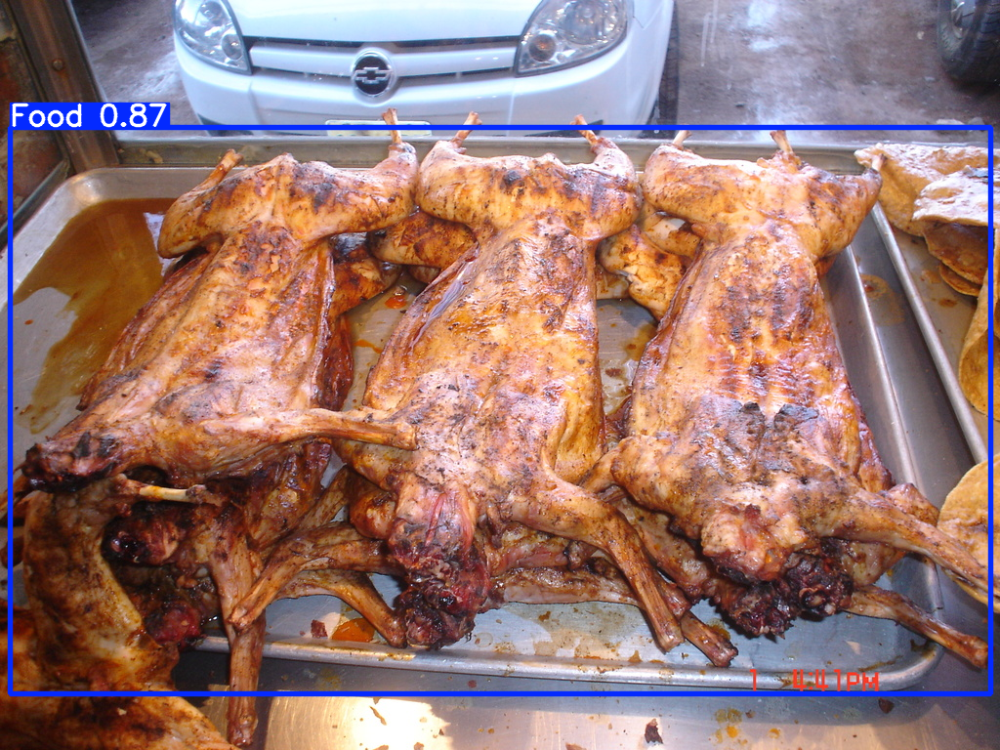

In [18]:
for image_name in image_names:
    image_path: str = os.path.join(OID_PATH, "images/test", image_name)
    results: Results = best_model(image_path, verbose=False)[0]
    display(results.plot()[:, :, ::-1])

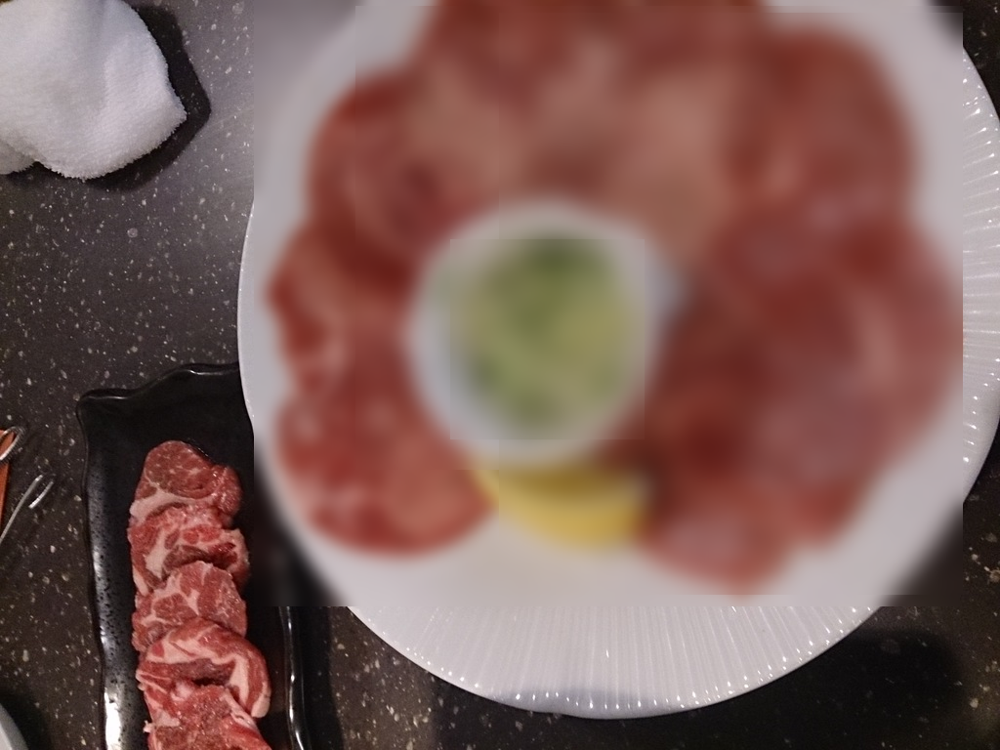

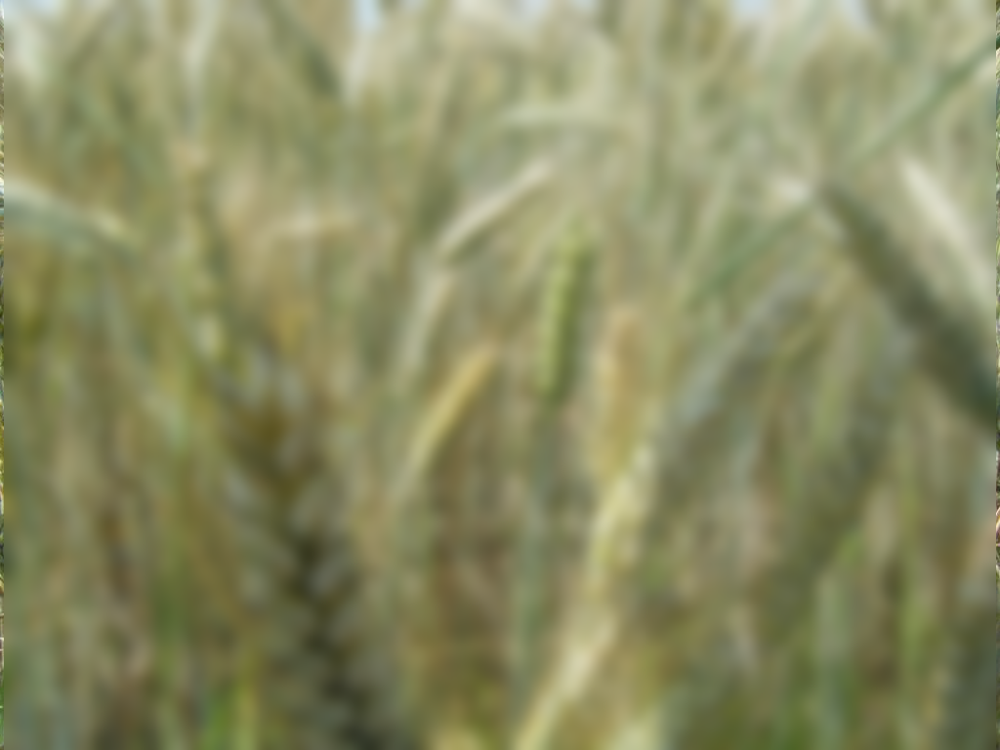

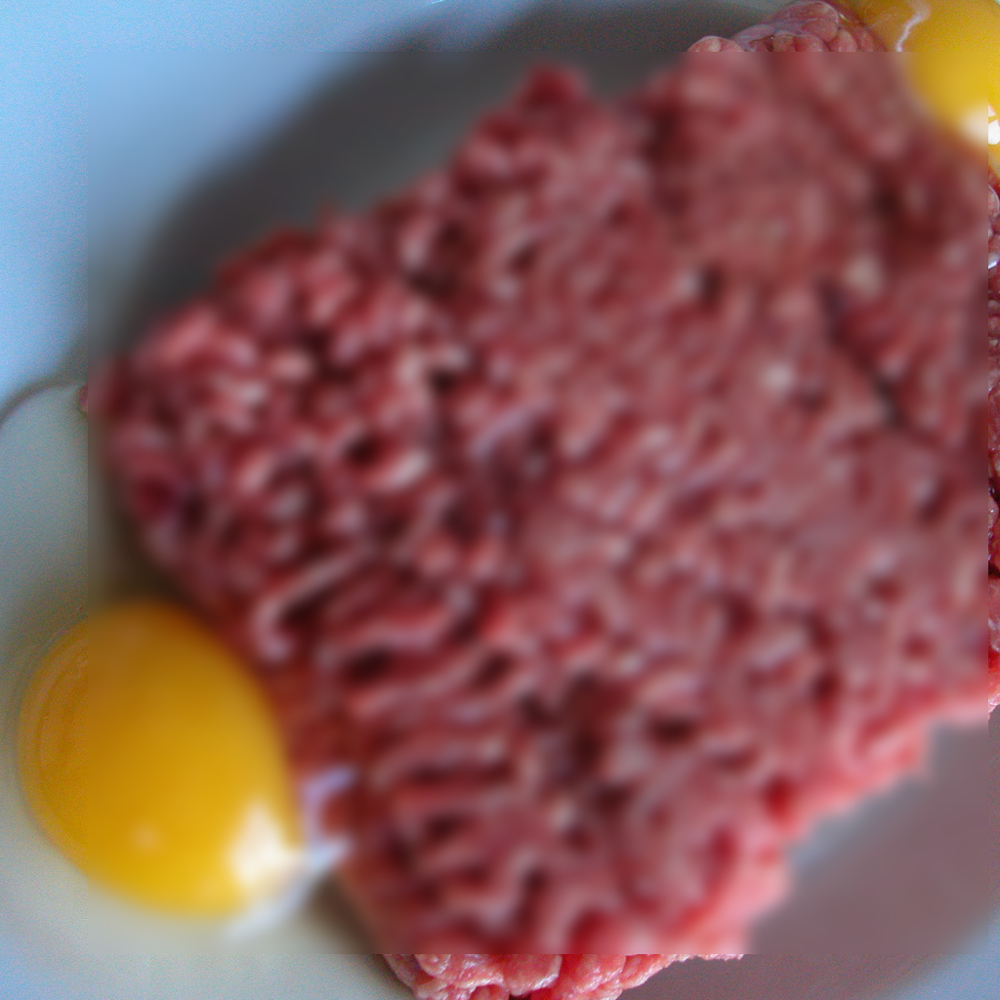

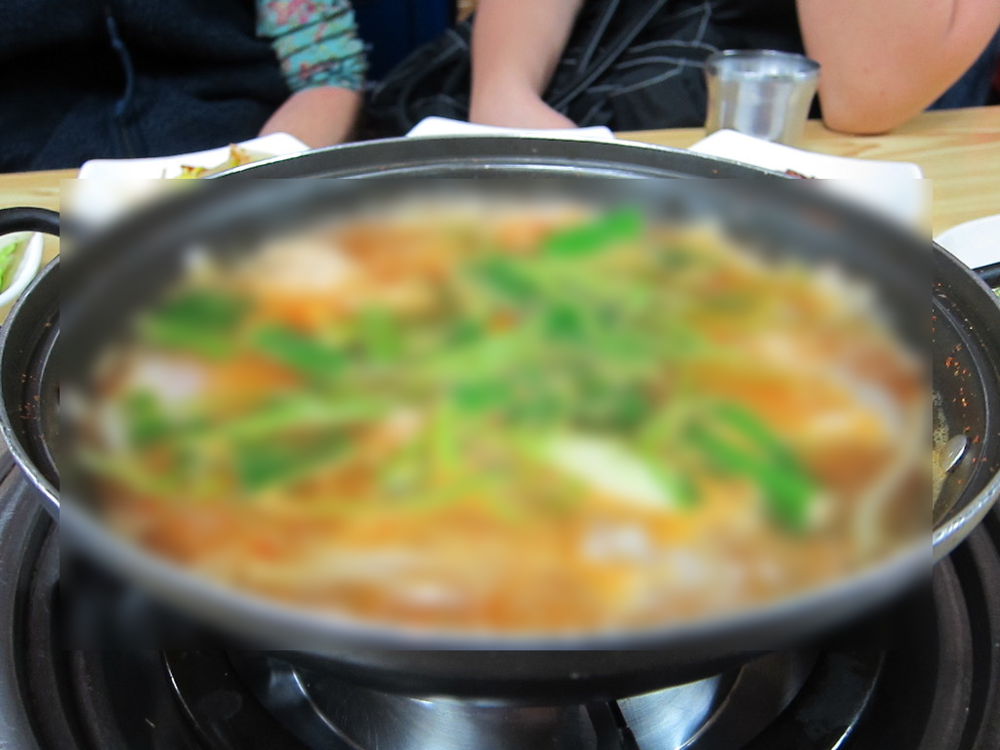

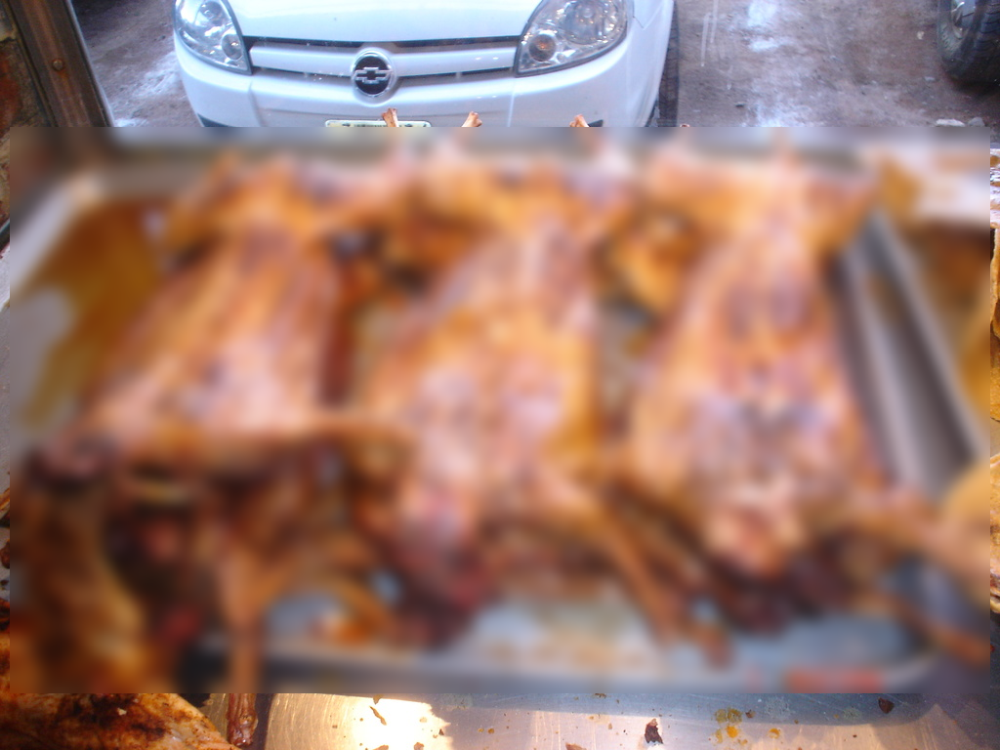

In [19]:
def blur_image(image: Image, results: Results) -> Image:
    for coords in results.boxes.xyxy.long():
        bbox: tuple[int, int, int, int] = coords.tolist()
        obj: Image = image.crop(bbox)
        blurred_obj: Image = obj.filter(ImageFilter.GaussianBlur(radius=8.0))
        image.paste(blurred_obj, bbox)

    return image


for image_name in image_names:
    image_path: str = os.path.join(OID_PATH, "images/test", image_name)
    image: Image = Image.open(image_path)
    results: Results = best_model(image_path, conf=0.3, verbose=False)[0]
    d.display(blur_image(image, results))